In [1]:
# BASICS
import xarray as xr
import numpy as np
import pandas as pd
import os
from datetime import datetime, timedelta
from pyproj import Proj, itransform, transform
import cftime

# PLOTS
import matplotlib.pyplot as plt
import matplotlib.ticker as tkr
from matplotlib.colors import from_levels_and_colors, ListedColormap
import cartopy.crs as ccrs

# REGRIDDING
import xesmf as xe

# CUSTOM FUNCTIONS
import utils

import warnings
warnings.filterwarnings('ignore')

%load_ext autoreload
%autoreload 2

In [2]:
save_dir = '/home/pfarnole/data/sibd/'

#### FUNCTIONS

In [ ]:
def generate_cmap(year):
    cmap = plt.get_cmap('Blues_r')
    c_levels = [datetime(year, m, 1).timetuple().tm_yday for m in range(1,13)]+[365]
    ncolors = len(c_levels)-1
    c_colors = np.linspace(1/ncolors,1,ncolors)
    cmap, norm = from_levels_and_colors(c_levels,cmap(c_colors))
    m_labels = [datetime(year, m, 1).strftime('%b') for m in range(1,13)]
    m_ticks = [datetime(year, m, 15).timetuple().tm_yday for m in range(1,13)]
    return cmap, norm, m_labels, m_ticks

def generate_cmap2(max_days=90):
    cmap = plt.get_cmap('PuOr')
    c_levels = np.arange(-max_days,max_days+1,30)
    ncolors = len(c_levels)-1
    c_colors = np.linspace(0,1,ncolors)
    cmap, norm = from_levels_and_colors(c_levels,cmap(c_colors))
    m_labels = None # [datetime(year, m, 1).strftime('%b') for m in range(1,13)]
    m_ticks = None # [datetime(year, m, 15).timetuple().tm_yday for m in range(1,13)]
    return cmap, norm # , m_labels, m_ticks

### ASMR - Prepare panArctic 2003-2019 SIBD

In [6]:
for y in range(2003,2020): # Dataset covers 2003-2019
    # 2012 only partially available in source dataset so not suited for sibd calculation
    if y==2012:
        continue
    print(y)
    data_sic = utils.load_asmr_sic(y).compute()
    data = utils.prep_sibd(data_sic,y)
    data.to_netcdf(os.path.join(save_dir+'ASMR',f'85-50_{y}.nc'))

2003
2004
2005
2006
2007
2008
2009
2010
2011
2013
2014
2015
2016
2017
2018
2019


### NAA - Prepare panArctic 2003-2015 SIBD

In [3]:
runs = {'DFS':'G510.00','CGRF':'C524.06','JRA':'C524.00-08'}
years = range(2003,2016)

for forcing in runs:
    print(forcing)
    for y in years:
        print(y)
        data_sic = utils.load_naa_sic(forcing,y).compute()
        data = utils.prep_sibd(data_sic,y)
        data.to_netcdf(os.path.join(save_dir+forcing,f'{y}.nc'))

DFS
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
CGRF
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
JRA
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015


In [4]:
runs = {'DFS':'G510.00','CGRF':'C524.06','JRA':'C524.00-08'}
years = range(2016,2023) #range(2003,2016)

for forcing in ['CGRF','JRA']: #runs
    print(forcing)
    for y in years:
        print(y)
        data_sic = utils.load_naa_sic(forcing,y).compute()
        data = utils.prep_sibd(data_sic,y)
        data.to_netcdf(os.path.join(save_dir+forcing,f'{y}.nc'))

CGRF
2016
2017
2018
2019
2020
2021
2022
JRA
2016
2017
2018
2019
2020
2021
2022


### LOAD datasets

In [3]:
data = {}
data['DFS'] = xr.open_mfdataset('/home/pfarnole/data/sibd/DFS/*')
data['CGRF'] = xr.open_mfdataset('/home/pfarnole/data/sibd/CGRF/*')
data['JRA'] = xr.open_mfdataset('/home/pfarnole/data/sibd/JRA/*')
data['ASMR'] = xr.open_mfdataset('/home/pfarnole/data/sibd/ASMR/*')

#### PLOT

In [4]:
regions = {'amundsen_gulf':[-140,-110,67,76],
           'panarctic':[-180,180,60,90],
          } #[-180,180,60,90] # [-140,-110,67,75] 

2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019


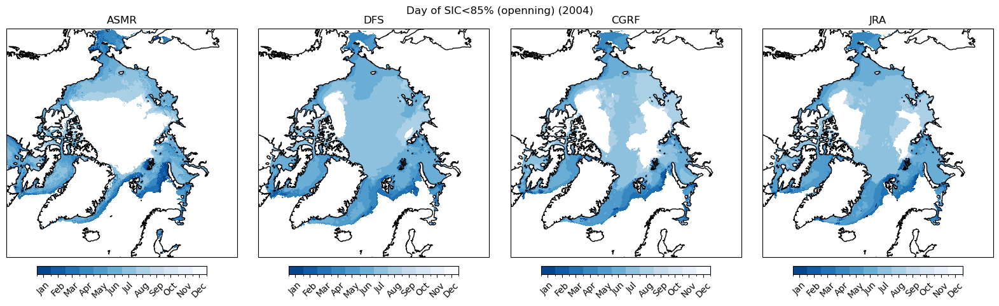

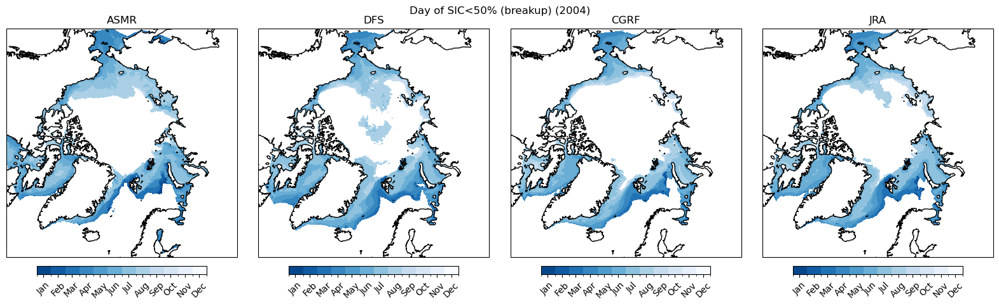

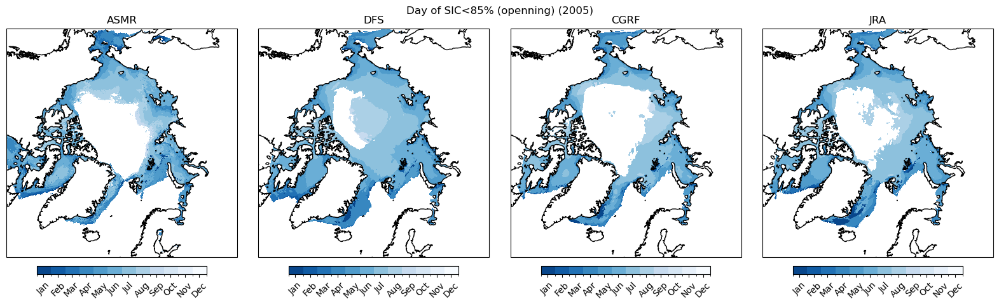

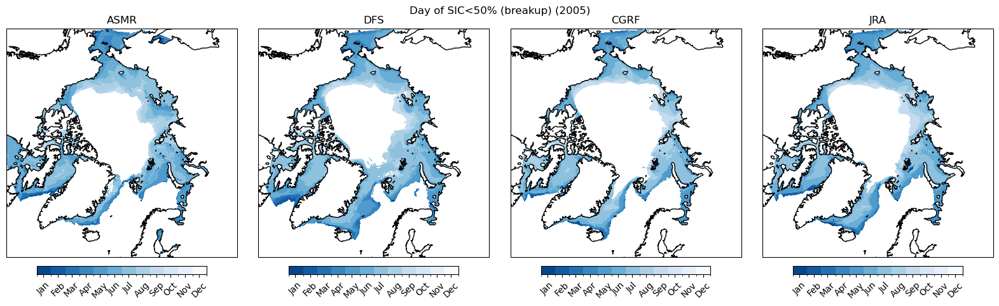

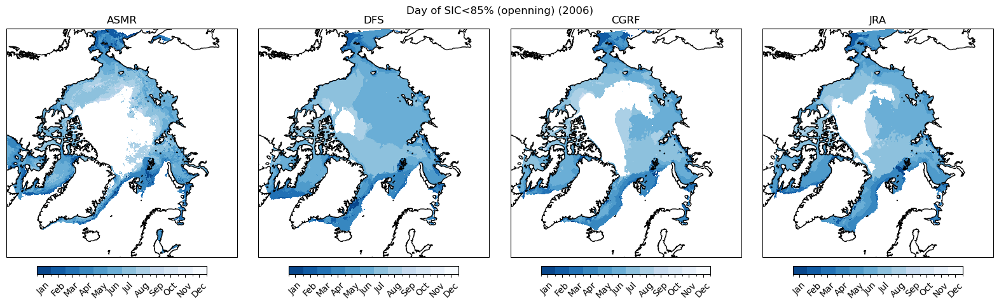

...

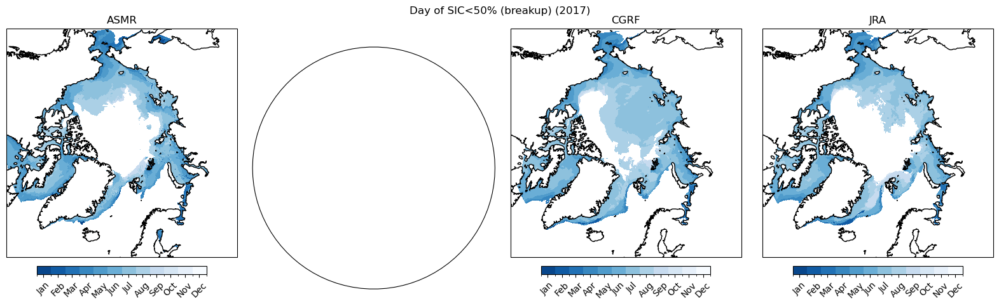

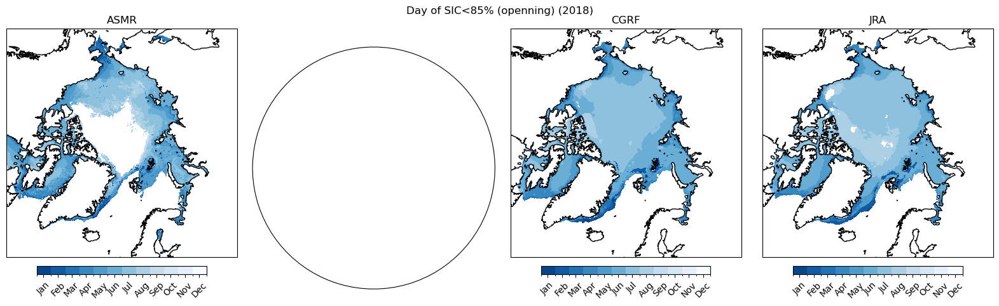

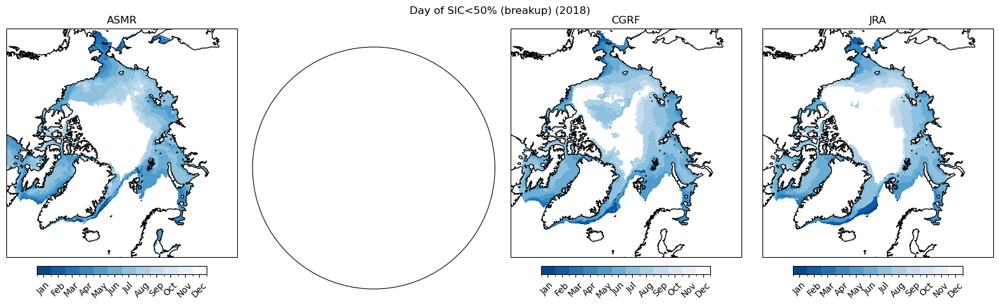

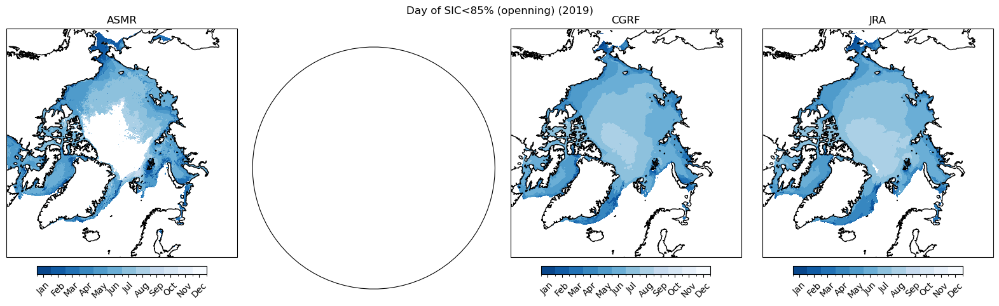

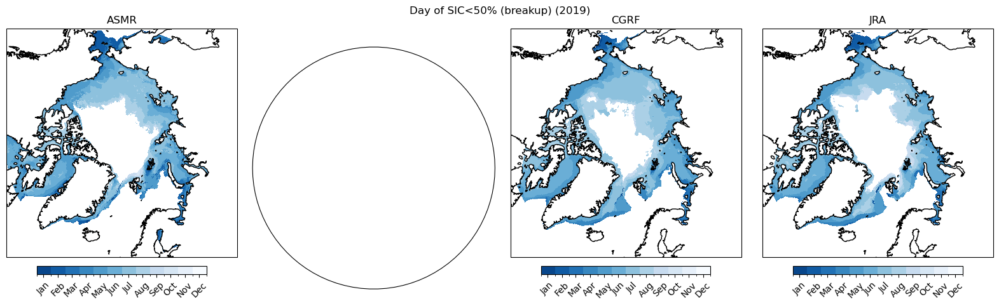

In [6]:
region,pheight = 'panarctic',4 # 'amundsen_gulf',5 # 'panarctic',4 #
doys = {'sibd85':'Day of SIC<85% (openning)',
        'sibd50':'Day of SIC<50% (breakup)',
        # 'sifd50':'Day of SIC>50% (freezup)',
        # 'sifd85':'Day of SIC>85% (closing)',
       }

datasets = ['ASMR','DFS','CGRF','JRA']
save_prefix = f'/home/pfarnole/data/sibd/plots_region/{region}'
plot_extent = regions[region]
central_longitude = 0.5*(plot_extent[0]+plot_extent[1])
ncols = len(datasets)
cmap = plt.get_cmap('Blues_r')

for y in range(2004,2020):
    print(y)
    for k in doys:
        fig, axs = plt.subplots(ncols=ncols,figsize=(pheight*ncols,5),subplot_kw={'projection':ccrs.NorthPolarStereo(central_longitude=central_longitude)})
        fig.suptitle(f"{doys[k]} ({y})")
        for i,ds in enumerate(datasets):
            if ((y==2012) and (ds=='ASMR')) or ((y>2015) and (ds=='DFS')):
                continue
            datay = data[ds].sel(year=y)
            cmap, norm, m_labels, m_ticks = generate_cmap(y)
            axs[i].coastlines()
            axs[i].set_title(ds)
            axs[i].set_extent(plot_extent, ccrs.PlateCarree())
            pl = axs[i].pcolormesh(datay.lon,datay.lat,datay[k].where(datay[k]),transform=ccrs.PlateCarree(),cmap=cmap,norm=norm)
            cbar = plt.colorbar(pl,ax=axs[i],orientation='horizontal',label=None,shrink=0.7,pad=0.03,ticks=m_ticks)
            cbar.ax.set_xticklabels(m_labels,rotation=45)
        fig.tight_layout()
        if save_prefix:
            plt.savefig(f'{save_prefix}_{y}_{k}.png')
        else:
            plt.show()

#### REGRID

In [7]:
from_dataset,to_dataset = 'DFS','ASMR'
regridder = xe.Regridder(data[from_dataset],data[to_dataset], 'nearest_s2d', periodic=True, ignore_degenerate=True)
data[f'{from_dataset}_reg'] = regridder(data[from_dataset])

# SAVE
data[f'{from_dataset}_reg'].to_netcdf(f'/home/pfarnole/data/sibd/{from_dataset}_regto_{to_dataset}.nc')

In [ ]:
# LOAD
from_dataset,to_dataset = 'DFS','ASMR'
data[f'{from_dataset}_reg'] = xr.open_dataset(f'/home/pfarnole/data/sibd/{from_dataset}_regto_{to_dataset}.nc')
data['ASMR'] = xr.open_mfdataset('/home/pfarnole/data/sibd/ASMR/*')

In [ ]:
# # VISUALIZE ORIGINAL VS REGRIDDED
# y = 2014
# v = 'sibd50' # sibd50, sibd85

# plot_extent =  [-150,-100,67,85] # [-180,180,60,90] # [-140,-110,67,75] # >> you can change for regional focus
# central_longitude = 0.5*(plot_extent[0]+plot_extent[1])
# vmax = float(data[from_dataset][v].sel(year=y).max())

# fig, axs = plt.subplots(ncols=2,figsize=(10,5),subplot_kw={'projection':ccrs.NorthPolarStereo(central_longitude=central_longitude)})
# fig.suptitle(y)
# for i,k in enumerate([from_dataset,f'{from_dataset}_regridded']):
#     axs[i].coastlines()
#     axs[i].set_title(k)
#     axs[i].set_extent(plot_extent, ccrs.PlateCarree())
#     pl = axs[i].pcolormesh(data[k].lon, data[k].lat, data[k][v].sel(year=y), transform=ccrs.PlateCarree(),vmin=0,vmax=vmax)
#     plt.colorbar(pl, ax=axs[i],orientation='horizontal',label=v,shrink=0.7,pad=0.03)
# fig.tight_layout()
# plt.show()

#### VISUALIZE

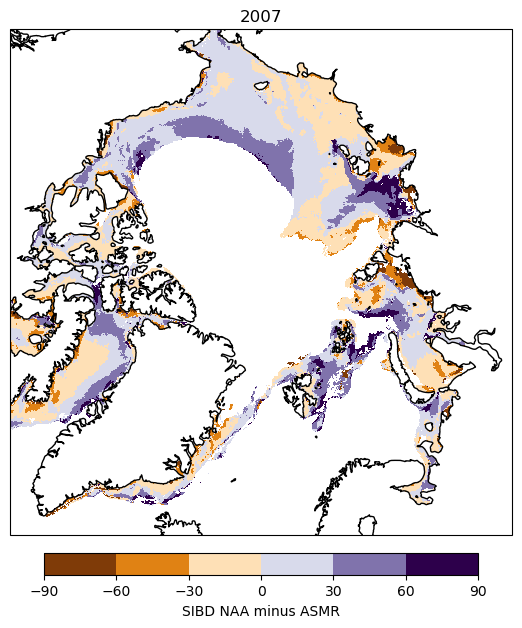

In [33]:
cmap, norm = generate_cmap2()

# VISUALIZE REGRIDDED VS ASMR
y = 2007
v = 'sibd50' # sibd50, sibd85

z = (data[f'{from_dataset}_reg'] - data['ASMR']).sel(year=y)
plot_extent = [-180,180,66,90] # [-180,180,60,90] # [-140,-110,67,75] # >> you can change for regional focus
central_longitude = 0.5*(plot_extent[0]+plot_extent[1])

fig, ax = plt.subplots(figsize=(8,8),subplot_kw={'projection':ccrs.NorthPolarStereo(central_longitude=central_longitude)})
ax.coastlines()
ax.set_title(y)
ax.set_extent(plot_extent, ccrs.PlateCarree())
pl = ax.pcolormesh(z.lon, z.lat, z[v], transform=ccrs.PlateCarree(),cmap=cmap,norm=norm)#,vmin=vmin,vmax=vmax) #norm=SymLogNorm(linthresh=10, linscale=0.1, vmin=vmin,vmax=vmax))
plt.colorbar(pl, ax=ax,orientation='horizontal', label='SIBD NAA minus ASMR',shrink=0.7,pad=0.03)
plt.show()

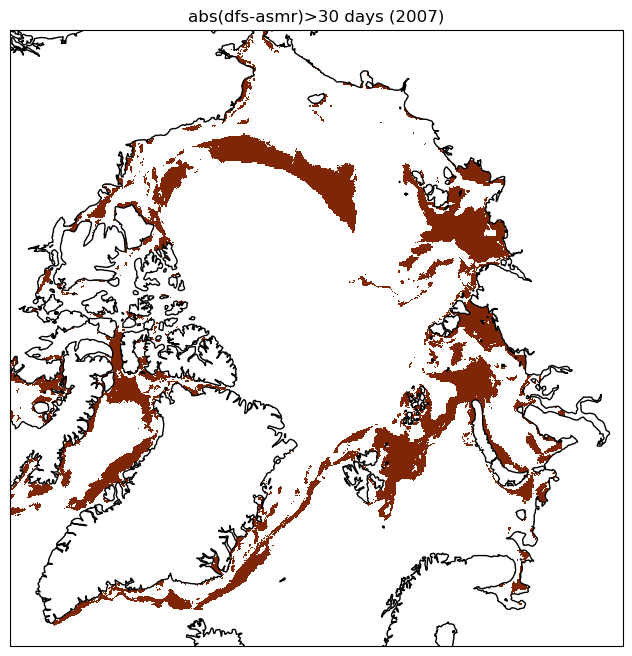

In [32]:
# TESTING 30 days threshold
y = 2007
v = 'sibd50' # sibd50, sibd85
z = (data[f'{from_dataset}_reg'] - data['ASMR']).sel(year=y)
z2 = xr.where(abs(z[v])>30,1,np.nan)
cmap = plt.get_cmap('Oranges_r')

fig, ax = plt.subplots(figsize=(8,8),subplot_kw={'projection':ccrs.NorthPolarStereo(central_longitude=central_longitude)})
ax.coastlines()
ax.set_title(f"abs(dfs-asmr)>30 days ({y})")
ax.set_extent(plot_extent, ccrs.PlateCarree())
ax.pcolormesh(z.lon,z.lat,z2.where(z2),transform=ccrs.PlateCarree(),cmap=cmap)
plt.show()

#### PLOT FOR PAPER

2005


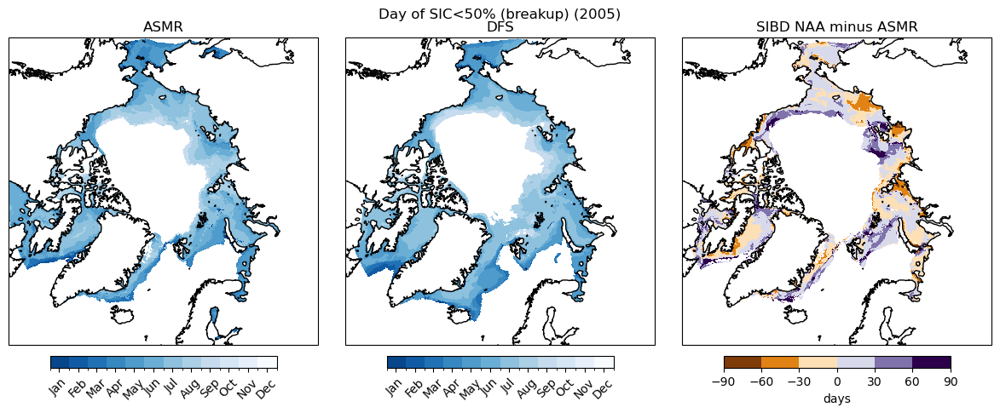

2007


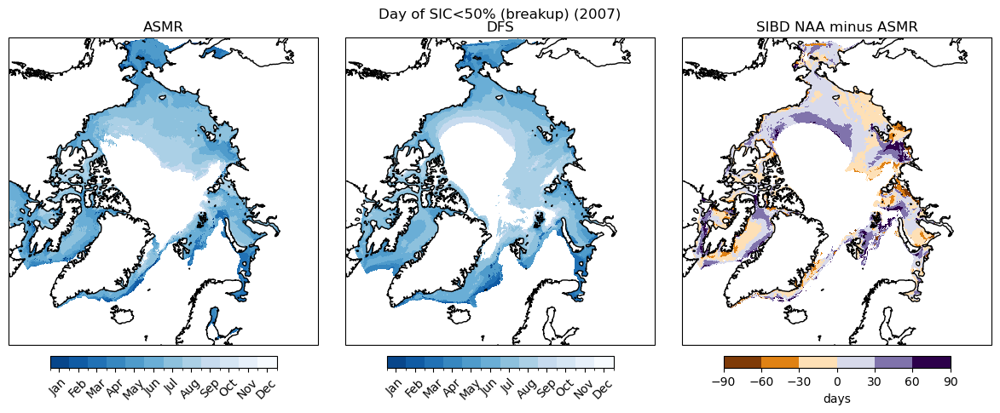

In [38]:
region,pheight = 'panarctic',6 # 'amundsen_gulf',5 # 'panarctic',4 #
doys = {'sibd85':'Day of SIC<85% (openning)',
        'sibd50':'Day of SIC<50% (breakup)',
        # 'sifd50':'Day of SIC>50% (freezup)',
        # 'sifd85':'Day of SIC>85% (closing)',
       }

datasets = ['ASMR','DFS'] #,'CGRF','JRA']
save_prefix = None # f'/home/pfarnole/data/sibd/plots_region/{region}'
plot_extent = regions[region]
central_longitude = 0.5*(plot_extent[0]+plot_extent[1])
ncols = len(datasets)
cmap = plt.get_cmap('Blues_r')

for y in [2005,2007]:
    print(y)
    for k in ['sibd50']:
        fig, axs = plt.subplots(ncols=ncols+1,figsize=(pheight*ncols,5),subplot_kw={'projection':ccrs.NorthPolarStereo(central_longitude=central_longitude)})
        fig.suptitle(f"{doys[k]} ({y})")
        for i,ds in enumerate(datasets):
            if ((y==2012) and (ds=='ASMR')) or ((y>2015) and (ds=='DFS')):
                continue
            datay = data[ds].sel(year=y)
            cmap, norm, m_labels, m_ticks = generate_cmap(y)
            axs[i].coastlines()
            axs[i].set_title(ds)
            axs[i].set_extent(plot_extent, ccrs.PlateCarree())
            pl = axs[i].pcolormesh(datay.lon,datay.lat,datay[k].where(datay[k]),transform=ccrs.PlateCarree(),cmap=cmap,norm=norm)
            cbar = plt.colorbar(pl,ax=axs[i],orientation='horizontal',label=None,shrink=0.7,pad=0.03,ticks=m_ticks)
            cbar.ax.set_xticklabels(m_labels,rotation=45)
        
        # DIFFERENCE
        cmap, norm = generate_cmap2()
        z = (data[f'DFS_reg'] - data['ASMR']).sel(year=y)
        axs[i+1].coastlines()
        axs[i+1].set_title('SIBD NAA minus ASMR')
        axs[i+1].set_extent(plot_extent, ccrs.PlateCarree())
        pl = axs[i+1].pcolormesh(z.lon, z.lat, z[k], transform=ccrs.PlateCarree(),cmap=cmap,norm=norm)
        plt.colorbar(pl, ax=axs[i+1],orientation='horizontal', label='days',shrink=0.7,pad=0.03)

        fig.tight_layout()
        if save_prefix:
            plt.savefig(f'{save_prefix}_{y}_{k}.png')
        else:
            plt.show()